In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import geopandas as gpd
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

from tqdm.auto import tqdm

In [ ]:
import os
project_path = os.getcwd() # Ubicación del proyecto

# Load Data

## Load Data de Ventas

In [ ]:
file_path = "/content/drive/MyDrive/Bootcamp-DS/Modulo 2/proyecto/data_cleaned.csv"
df = pd.read_csv(file_path, parse_dates=['Order Date', 'Ship Date'])
print(df.shape)
df.head()

(1474, 23)


,Row ID,Order ID,Customer ID,Ship Mode,Order Date,Ship Date,period,Season,year,month,...,City,Segment,Sub-Category,Product ID,Product Name,Discount,Sales,Quantity,unit_value,Profit
0,4,US-2015-108966,SO-20335,Standard Class,2015-10-11,2015-10-18,811 days,Fall,2015,10,...,Fort Lauderdale,Consumer,Tables,FUR-TA-10000577,Bretford CR4500 Series Slim Rectangular Table,0.45,957.5775,5,191.5155,-383.0310
1,11,CA-2014-115812,BH-11710,Standard Class,2014-06-09,2014-06-14,1300 days,Summer,2014,6,...,Los Angeles,Consumer,Tables,FUR-TA-10001539,Chromcraft Rectangular Conference Tables,0.20,1706.1840,9,189.5760,85.3092
2,25,CA-2015-106320,EB-13870,Standard Class,2015-09-25,2015-09-30,827 days,Fall,2015,9,...,Orem,Consumer,Tables,FUR-TA-10000577,Bretford CR4500 Series Slim Rectangular Table,0.00,1044.6300,3,348.2100,240.2649
3,28,US-2015-150630,TB-21520,Standard Class,2015-09-17,2015-09-21,835 days,Fall,2015,9,...,Philadelphia,Consumer,Bookcases,FUR-BO-10004834,"Riverside Palais Royal Lawyers Bookcase, Royal...",0.50,3083.4300,7,440.4900,-1665.0522
4,30,US-2015-150630,TB-21520,Standard Class,2015-09-17,2015-09-21,835 days,Fall,2015,9,...,Philadelphia,Consumer,Furnishings,FUR-FU-10004848,"Howard Miller 13-3/4"" Diameter Brushed Chrome ...",0.20,124.2000,3,41.4000,15.5250


### Imputamos Coordenadas faltantes

In [ ]:
df.Coordinates.unique()

array(['(27.9944, -81.7603)', '(36.7783, -119.4179)',
       '(39.32, -111.0937)', '(41.2033, -77.1945)', '(31.9686, -99.9018)',
       '(40.2672, -86.1349)', '(40.7128, -74.006)', '(40.6331, -89.3985)',
       '(35.5175, -86.5804)', '(33.8361, -81.1637)',
       '(40.4173, -82.9071)', '(43.7844, -88.7879)',
       '(39.5501, -105.7821)', '(46.7296, -94.6859)',
       '(40.0583, -74.4057)', '(47.7511, -120.7401)',
       '(42.4072, -71.3824)', '(32.3547, -89.3985)',
       '(44.3148, -85.6024)', '(34.0489, -111.0937)',
       '(37.9643, -91.8318)', '(37.8393, -84.27)', '(38.9108, -75.5277)',
       'Unknown', '(41.4925, -99.9018)', '(41.6032, -73.0877)',
       '(35.7596, -79.0193)', '(35.201, -91.8318)', '(39.0458, -76.6413)',
       '(32.1656, -82.9001)', '(32.3182, -86.9023)',
       '(38.8026, -116.4194)', '(38.9072, -77.0369)',
       '(43.8041, -120.5542)', '(35.4676, -97.5164)',
       '(30.9843, -91.9623)', '(41.5801, -71.4774)',
       '(43.1939, -71.5724)', '(45.2538, -69.445

In [ ]:
# ¿En qué Estados?
df[df.Coordinates=='Unknown'].State.unique()

array(['Virginia', 'New Mexico', 'Texas', 'Kansas'], dtype=object)

In [ ]:
# Imputamos
# Los valores fueron extraidos manualmente de google maps
df.loc[(df.State=='Kansas') & (df.Coordinates=='Unknown'), ['Coordinates']] = '(38.691750, -98.202577)'
df.loc[(df.State=='New Mexico') & (df.Coordinates=='Unknown'), ['Coordinates']] = '(33.791672, -106.019002)'
df.loc[(df.State=='Virginia') & (df.Coordinates=='Unknown'), ['Coordinates']] = '(37.127156, -77.982101)'
df.loc[(df.State=='Texas') & (df.Coordinates=='Unknown'), ['Coordinates']] = '(30.152971, -98.973098)'
# Kansas: 38.691750, -98.202577
# New Mexico: 33.791672, -106.019002
# Virginia: 37.127156, -77.982101
# Texas: 30.152971, -98.973098

In [ ]:
# Confirmamos la imputación
df[df.Coordinates=='Unknown'].State.unique()

array([], dtype=object)

## Load GroPandas de Estados de US

[geojson US-States](https://eric.clst.org/tech/usgeojson/)

In [ ]:
#gdf = gpd.read_file("/content/drive/My Drive/Bootcamp-DS/Modulo 2/geo files/map.geojson")
zonas = gpd.read_file("/content/drive/My Drive/Bootcamp-DS/Modulo 2/proyecto/gz_us.json")
display(
    zonas.shape,
    zonas.head()
)


(52, 6)

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry
0,0400000US23,23,Maine,,30842.923,"MULTIPOLYGON (((-67.61976 44.51975, -67.61541 ..."
1,0400000US25,25,Massachusetts,,7800.058,"MULTIPOLYGON (((-70.83204 41.60650, -70.82373 ..."
2,0400000US26,26,Michigan,,56538.901,"MULTIPOLYGON (((-88.68443 48.11579, -88.67563 ..."
3,0400000US30,30,Montana,,145545.801,"POLYGON ((-104.05770 44.99743, -104.25015 44.9..."
4,0400000US32,32,Nevada,,109781.180,"POLYGON ((-114.05060 37.00040, -114.04999 36.9..."


In [ ]:
zonas = zonas.rename(columns={'NAME':'State'})[['State', 'geometry']]
display(
    zonas.shape,
    zonas.head()
)


(52, 2)

,State,geometry
0,Maine,"MULTIPOLYGON (((-67.61976 44.51975, -67.61541 ..."
1,Massachusetts,"MULTIPOLYGON (((-70.83204 41.60650, -70.82373 ..."
2,Michigan,"MULTIPOLYGON (((-88.68443 48.11579, -88.67563 ..."
3,Montana,"POLYGON ((-104.05770 44.99743, -104.25015 44.9..."
4,Nevada,"POLYGON ((-114.05060 37.00040, -114.04999 36.9..."


# Variables de interés

1. ¿Cuál es la distribución de las ventas ('Sales') en el dataset?
    - Sales
2. Análisis de tendencias por Estado y por Tipo de Cliente
    - State, sales, State, City, Segment
3. ¿Vale la pena incluir un descuento para personas que contratan First Class?

    Operación: Tendencia por clase, tendencia de ‘Custumer ID’ unique por mes
    - Ship Mode, Profit, Custumer ID, ...

    es viable?...

    Cómo ha evolucionado el uso de 1st class en el tiempo respecto a las alternativas? (profit y número de compras por ...)

    Hay una diferencia significativa de ganancia entre los Ship Mode? (BoxPlot)

    El profit actual es suficiente incluso luego del descuento?

    cuánto como máximo podemos permitirnos de descuento?

    cuántos posibles compradores podríamos transferir a first class?

    cuántos de first class se cambian a una inferior??

    ¿Cuántos necesitaríamos para que la campaña tenga ganancias (durante su ejecución) ?

    Tenemos clientes fidelizados??

# ¿Cuál es la distribución de las ventas ('Sales') en el dataset?

<Axes: >

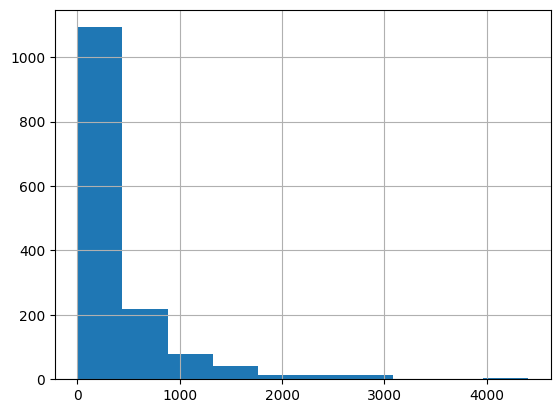

In [ ]:
df.Sales.hist()

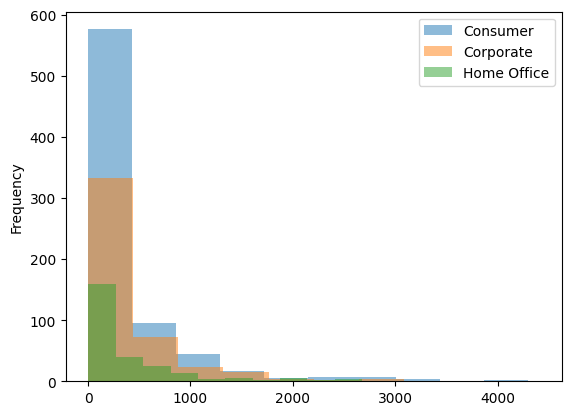

In [ ]:
#@title histograma de Sales por Segment

df.groupby('Segment')['Sales'].plot.hist(alpha=0.5)
plt.legend()
plt.show()


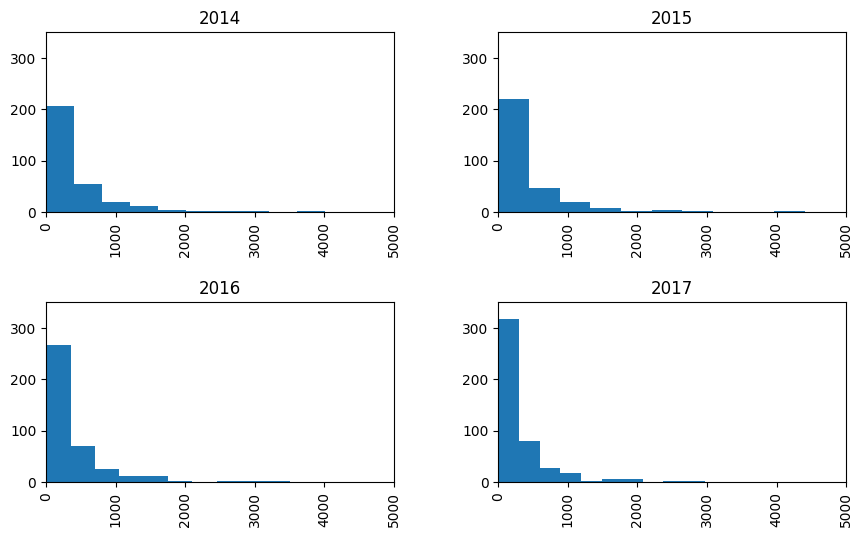

In [ ]:
#@title histograma de Sales por año

df['Order Year'] = pd.DatetimeIndex(df['Order Date']).year

axes = df.hist(column='Sales', by='Order Year', figsize=(10, 6))
plt.xlim(0, 5000)
# Iterar sobre todos los axes y establecer el mismo límite de x para cada uno
# flatten() es necesario si 'axes' es una matriz de 2D
for ax in axes.flatten():
    ax.set_xlim(0, 5000)
    ax.set_ylim(0, 350)

plt.show()

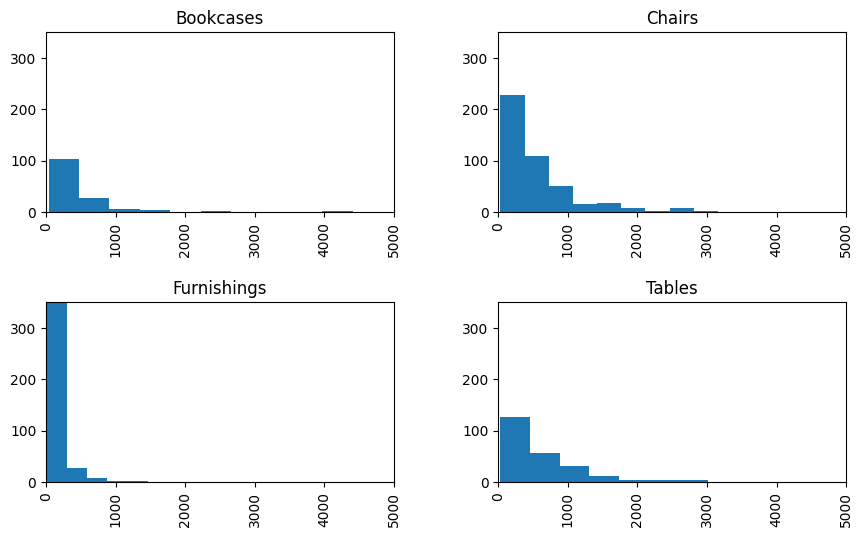

In [ ]:
#@title histograma de Sales por Sub-Category
axes = df.hist(column='Sales', by='Sub-Category', figsize=(10, 6))
plt.xlim(0, 5000)
# Iterar sobre todos los axes y establecer el mismo límite de x para cada uno
# flatten() es necesario si 'axes' es una matriz de 2D
for ax in axes.flatten():
    ax.set_xlim(0, 5000)
    ax.set_ylim(0, 350)

plt.show()

# Analisis de tendencia por estado

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1474 entries, 0 to 1473
Data columns (total 23 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Row ID        1474 non-null   int64         
 1   Order ID      1474 non-null   object        
 2   Customer ID   1474 non-null   object        
 3   Ship Mode     1474 non-null   object        
 4   Order Date    1474 non-null   datetime64[ns]
 5   Ship Date     1474 non-null   datetime64[ns]
 6   period        1474 non-null   object        
 7   Season        1474 non-null   object        
 8   year          1474 non-null   int64         
 9   month         1474 non-null   int64         
 10  day_of_week   1474 non-null   int64         
 11  Coordinates   1474 non-null   object        
 12  State         1474 non-null   object        
 13  City          1474 non-null   object        
 14  Segment       1474 non-null   object        
 15  Sub-Category  1474 non-null   object  

<Axes: xlabel='Order Date'>

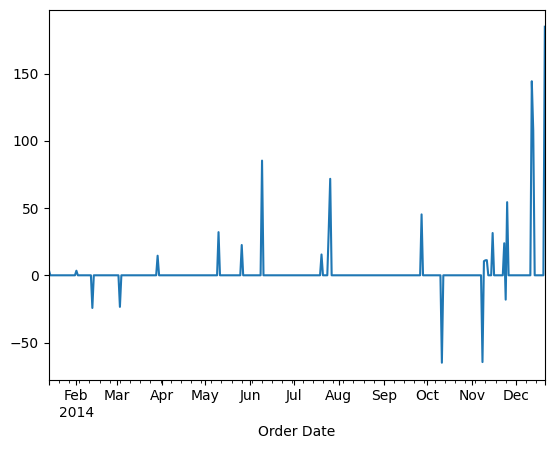

In [ ]:
df_copy = df.groupby(['State', 'Segment', 'Order Date'])['Profit'].sum().reset_index().set_index('Order Date')
df_copy[(df_copy.Segment=='Consumer') & (df_copy.State=='California') & (df_copy.index.year==2014)]['Profit'].groupby(pd.Grouper(freq='D')).sum().plot()

<Axes: xlabel='Order Date'>

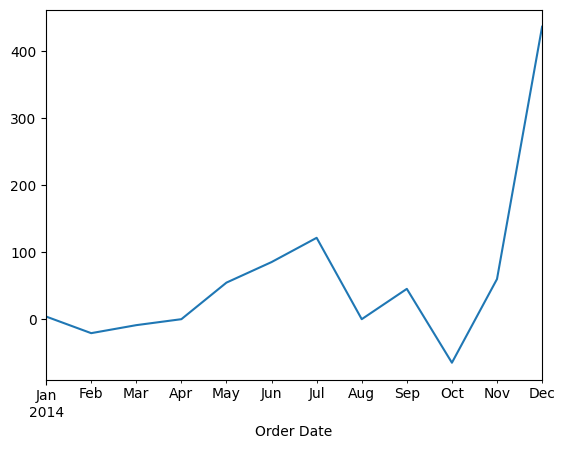

In [ ]:
#@title Tendencia interpretable analizando por mes
df_copy = df.groupby(['State', 'Segment', 'Order Date'])['Profit'].sum().reset_index().set_index('Order Date')
df_copy[(df_copy.Segment=='Consumer') & (df_copy.State=='California') & (df_copy.index.year==2014)]['Profit'].groupby(pd.Grouper(freq='M')).sum().plot()

## Funciones necesarias

In [ ]:
#@title Cálculo de la tendencia por State y Segment
from sklearn.linear_model import LinearRegression
import datetime
from scipy import stats

''' Ejemplo de estructura de data_corr
{
    'State':
    'coor':
    'significancia':
    'm':
}
'''

def tendence_per_StateSegment(year):
    if year not in df['Order Date'].dt.year.unique(): return None

    df_copy = df[df['Order Date'].dt.year==year].copy(deep=True)

    data_per_segment = dict()
    segment = df.Segment.unique().tolist()
    for seg in tqdm(segment):

        data_corr = dict()
        data_corr['State'] = []
        data_corr['Segment'] = []
        data_corr['coor'] = []
        data_corr['significancia'] = []
        data_corr['m'] = []
        data_corr['m_corrected'] = []
        data_corr['sentido'] = []

        data = df_copy.loc[(df_copy.Segment==seg), :]
        data.set_index('Order Date', inplace=True)

        for state in tqdm(data.State.unique()):
            data_perState = data.loc[data.State==state, ['Profit']].groupby(pd.Grouper(freq='M')).sum()
            # Convertir el índice datetime a valores numéricos
            time_numeric = data_perState.index.map(datetime.datetime.toordinal)

            n_registers = time_numeric.shape[0]

            corr, m = 0, 0 # inicializamos variables
            p_value = None
            if n_registers > 4:
                # ----------------------- Correlación -------------------------
                # Calcular el coeficiente de correlación de Pearson
                corr, p_value = stats.pearsonr(time_numeric, data_perState['Profit'])
                # p_value ayuda al análisis de la Significancia de la correlación

                # ------------------ Tendencia (pendiente) --------------------
                # Preparar los datos para la regresión
                X, y = np.array(time_numeric).reshape(-1,1), data_perState['Profit']

                # Crear y ajustar el modelo de regresión lineal
                model = LinearRegression()
                model.fit(X, y)

                # La pendiente de la regresión
                m = model.coef_[0]

            # ------------------------- guardar ---------------------------
            data_corr['State'].append(state)
            data_corr['Segment'].append(seg)
            data_corr['coor'].append(corr)
            data_corr['significancia'].append(p_value)
            data_corr['m'].append(m)
            condition = (abs(corr)>=0.5) #& (p_value<0.05)
            m_corrected = m if condition else 0
            data_corr['m_corrected'].append(m_corrected)
            data_corr['sentido'].append(1 if m_corrected>=0 else -1)

        dataframe = pd.DataFrame(data_corr)
        dataframe['Segment'] = seg
        data_per_segment[seg] = dataframe

    # Se unen los dataframes de los 3 segmentos y los retornamos
    return pd.concat(list(data_per_segment.values())).set_index(['State', 'Segment'])


In [ ]:
#@title Cálculo de las coordenadas para las burbujas
def mean_coordintes_per_State():
    data_coors = df['Coordinates'].str.replace('\(|\)', '', regex=True).str.split(',', expand=True).astype('float32')

    state_coordinates = pd.DataFrame()
    state_coordinates['State'] = df.State
    state_coordinates['lat'] = data_coors[0]
    state_coordinates['lon'] = data_coors[1]
    return state_coordinates.groupby('State').agg({'lat': 'mean', 'lon': 'mean'})

In [547]:
# Cargamos toda la info de los 4 años
data_all_years = {y: tendence_per_StateSegment(y) for y in [2014, 2015, 2016, 2017]}

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

4.428953545033705

In [557]:
#@title Función para graficar Choropletic

# Calculamos el máximo valor para las burbujas
lista_dataframes = []
for y in [2014, 2015, 2016, 2017]:
    df_temporal = data_all_years[y]
    df_temporal['year'] = y
    lista_dataframes.append(df_temporal)
max_value_burble = np.abs(pd.concat(lista_dataframes)['m_corrected']).max()

def plot_burble_choroplet(year):
    data_for_map = data_all_years[year][['m_corrected', 'sentido']]\
                                            .reset_index()\
                                            .merge(mean_coordintes_per_State().reset_index(),
                                                on='State')

    # ------------------- Choropletic de ganancias por Estado ------------------
    profit_per_YearState = df.groupby([df['Order Date'].dt.year, 'State'])['Profit'].sum()
    gdf_profit = gpd.GeoDataFrame(
        pd.merge(profit_per_YearState[year].reset_index(),
                zonas,
                on='State'),
        geometry='geometry'
    )

    colorscale = [
        [0, 'rgba(255, 0, 0, 0.5)'],  # Rojo con 50% de opacidad
        [0.5, 'rgba(255, 255, 255, 0.5)'],  # Amarillo con 50% de opacidad
        [1, 'rgba(0, 0, 255, 0.5)']  # Azul con 50% de opacidad
    ]
    # Crear el mapa coroplético base
    fig = go.Figure(go.Choropleth(
        geojson=gdf_profit.__geo_interface__,
        locations=gdf_profit.State.index, # o la columna en gdf que tiene el identificador de la región
        z=gdf_profit['Profit'], # Reemplazar con la variable de interés
        colorscale=colorscale, #'rdylbu'
        showscale=True,
        zmin=-2500,  # Valor mínimo considerado para la escala de colores
        zmax=2500,   # Valor máximo considerado para la escala de colores
        colorbar=dict(
            title='Color Scale',
            x=0.15,  # Posición en el eje x, donde -0.1 es a la izquierda del gráfico
        ),
    ))

    # --------------------------- Burble Choropletic ---------------------------
    # Definir un mapa de colores para cada segmento
    color_map = {
        'Consumer': [('blue', 0.6), ('red', 0.6)],
        'Home Office': [('yellow', 0.8), ('brown', 0.8)],
        'Corporate': [('white', 1), ('black', 0.8)],
    }

    # Iterar sobre cada segmento para añadir un conjunto de burbujas por segmento
    for segment in data_for_map['Segment'].unique():
        segment_df = data_for_map[data_for_map['Segment'] == segment]
        for sent in segment_df['sentido'].unique():
            new_segment_df = segment_df[segment_df.sentido==sent]
            idx_sent = 0 if sent==1 else 1
            sizes = 500*(new_segment_df['m_corrected'] / max_value_burble)
            sentido = 'POSITIVA (+)' if sent==1 else 'NEGATIVA (-)'
            if sent==-1: sizes = -1*sizes # Corregir a positivo los tamaños
            fig.add_trace(go.Scattergeo(
                locationmode = 'USA-states',
                lon = new_segment_df['lon'],
                lat = new_segment_df['lat'],
                text = new_segment_df['State'] + '<br>Segmento: ' + segment + '<br>tend: ' + new_segment_df['m_corrected'].astype(str), # hover text
                marker = dict(
                    size = sizes,
                    color = color_map[segment][idx_sent][0],
                    line_color='rgb(40,40,40)',
                    line_width=0.5,
                    opacity=color_map[segment][idx_sent][1],
                    sizemode = 'area',
                ),
                name = segment+' tend '+sentido
            ))

    # Ajustes de layout del mapa
    fig.update_layout(
        title_text = 'Mapa de Burbujas de EE. UU. por Segmento',
        showlegend = True,
        geo = dict(
            scope = 'usa', # Grafica solo la sección de EE.UU.
            landcolor = 'rgb(217, 217, 217)',
        ),
        legend=dict(
            x=0.8,  # Un valor de 0 posiciona la leyenda al extremo izquierdo
        ),
    )

    return fig

## Animación

In [564]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.io as pio

# Asumimos que figs_per_year es una lista de figuras de Plotly generadas previamente.

# Crear la figura base utilizando el layout de la primera figura
fig = go.Figure(data=figs_per_year[0].data, layout=figs_per_year[0].layout)

# Crear los frames para la animación, asegurándonos de copiar los datos y el layout
frames = [go.Frame(data=f.data, name=str(2014+i)) for i, f in enumerate(figs_per_year)]

# Añadir los frames a la figura
fig.frames = frames

# Configurar los botones de animación
fig.update_layout(
    updatemenus=[
        {
            "buttons": [
                {
                    "args": [None, {"frame": {"duration": 3000, "redraw": True},
                                    "fromcurrent": True,
                                    "transition": {"duration": 1000, "easing": "linear"}
                                    }
                             ],
                    "label": "Play",
                    "method": "animate"
                },
                {
                    "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate",
                                      "transition": {"duration": 0}
                                      }],
                    "label": "Pause",
                    "method": "animate"
                }
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 70},
            "showactive": True,
            "type": "buttons",
            "x": 0.1,
            "xanchor": "right",
            "y": 0,
            "yanchor": "top"
        }
    ]
)

# Configurar el slider para la animación
sliders = [{
    "steps": [
        {
            "args": [
                [str(2014 + i)],
                {
                    "frame": {"duration": 3000, "redraw": True},
                    "mode": "immediate",
                    "transition": {"duration": 1000, "easing": "linear"}
                }
            ],
            "label": str(2014 + i),
            "method": "animate"
        } for i in range(len(figs_per_year))
    ],
    "transition": {"duration": 300},
    "x": 0,
    "y": 0,
    "currentvalue": {
        "font": {"size": 12},
        "prefix": "Año: ",
        "visible": True
    }
}]

fig.update_layout(sliders=sliders)

# Mostrar la figura interactiva en Colab
pio.show(fig, renderer="colab")

### Animación vinculada

In [542]:
import plotly.graph_objects as go
import pandas as pd
import geopandas as gpd
import numpy as np

# Preparar figuras base para la animación, sin datos
fig = go.Figure()

years = [2014, 2015, 2016, 2017]

# Crear una lista para almacenar los frames
frames = []
profit_per_YearState = df.groupby([df['Order Date'].dt.year, 'State'])['Profit'].sum()

for year in years:
    data_for_map = tendence_per_StateSegment(year)[['m_corrected', 'sentido']]\
                                                  .reset_index()\
                                                  .merge(mean_coordintes_per_State().reset_index(),
                                                         on='State')
    gdf_profit = gpd.GeoDataFrame(
        pd.merge(profit_per_YearState[year].reset_index(),
                 zonas,
                 on='State'),
        geometry='geometry'
    )

    # Crear el mapa coroplético para el año actual en el bucle
    choropleth = go.Choropleth(
        geojson=gdf_profit.__geo_interface__,
        locations=gdf_profit.State.index,  # Asegúrate de que esto coincida con el índice o la columna adecuada
        z=gdf_profit['Profit'],
        colorscale=[
            [0, 'rgba(255, 0, 0, 0.5)'],
            [0.5, 'rgba(255, 255, 255, 0.5)'],
            [1, 'rgba(0, 0, 255, 0.5)']
        ],
        showscale=True,
        zmin=-2500,
        zmax=2500,
        colorbar=dict(
            title='Color Scale',
            x=0.15,
        ),
    )

    # Crear los trazos de Scattergeo (burbujas) para el año actual en el bucle
    scattergeo_traces = []
    color_map = {
        'Consumer': [('blue', 0.6), ('red', 0.6)],
        'Home Office': [('yellow', 0.8), ('brown', 0.8)],
        'Corporate': [('white', 1), ('black', 0.8)],
    }

    for segment in data_for_map['Segment'].unique():
        segment_df = data_for_map[data_for_map['Segment'] == segment]
        for sent in segment_df['sentido'].unique():
            new_segment_df = segment_df[segment_df.sentido == sent]
            idx_sent = 0 if sent == 1 else 1
            sizes = 10 * (new_segment_df['m_corrected'] / np.abs(data_for_map['m_corrected']).max() * 50)
            sentido = 'POSITIVA (+)' if sent == 1 else 'NEGATIVA (-)'
            if sent == -1: sizes = -1 * sizes  # Corregir a positivo los tamaños
            scattergeo_traces.append(go.Scattergeo(
                locationmode='USA-states',
                lon=new_segment_df['lon'],
                lat=new_segment_df['lat'],
                text=new_segment_df['State'] + '<br>Segmento: ' + segment + '<br>Tend: ' + new_segment_df['m_corrected'].astype(str),
                marker=dict(
                    size=sizes,
                    color=color_map[segment][idx_sent][0],
                    line_color='rgb(40,40,40)',
                    line_width=0.5,
                    opacity=color_map[segment][idx_sent][1],
                    sizemode='area',
                ),
                name=segment + ' tend ' + sentido
            ))

    # Agregar el frame correspondiente al año actual
    frames.append(go.Frame(data=[choropleth] + scattergeo_traces, name=str(year)))

# Agregar los frames a la figura
fig.frames = frames

# Crear botones de play y pausa para la animación
fig.update_layout(
    updatemenus=[dict(
        type="buttons",
        buttons=[dict(label="Play",
                      method="animate",
                      args=[None, dict(frame=dict(duration=500, redraw=True), fromcurrent=True, mode='immediate')]),
                 dict(label="Pause",
                      method="animate",
                      args=[[None], dict(frame=dict(duration=0, redraw=False), mode='immediate')])]
    )]
)

# Configurar el layout inicial
fig.update_layout(
    title_text='Mapa de Burbujas de EE. UU. por Segmento y Año',
    showlegend=True,
    geo=dict(
        scope='usa',
        landcolor='rgb(217, 217, 217)',
    ),
    legend=dict(x=0.8),
    sliders=[dict(steps=[dict(method='animate',
                              args=[[str(year)],
                                    dict(mode='immediate', frame=dict(duration=500, redraw=True),
                                         fromcurrent=True)
                                    ],
                              label=str(year))
                         for year in years],
                  transition=dict(duration=0),
                  x=0, y=0,
                  currentvalue=dict(prefix="Año: ",
                                    visible=True
                                    )
                  )
    ]
)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

In [544]:
pio.show(fig, renderer="colab")

## Análisis

- Distribución Geográfica del Profit:
    - El Este del país muestra un **comportamiento marcable y predecible**.
        - ¿Cómo se visualiza?: hay más burbujas en el lado este del país.
            La presencia de burbujas implica la existencia de una tendencia, mientras que la ausencia de esta implica que el Profit se mantiene constante o en promedio cercano a un valor fijo (generalmente cero).
    - Ciertos estados muestran una ganancia constante a lo largo de los años (como se ve en la coloración del mapa), mientras que otros muestran una variabilidad más significativa.
        - ¿Cómo se visualiza?: esto se ve por la ausencia de burbujas en los Estados
        - Razón: Puede ser por:
            - Hay pocos datos para calcular la tendencia
            - La tendencia es muy cercana a cero, lo que representa la poca variabilidad
            - Los datos muestran variabilidad, pero no una tendencia específica, por lo que en promedio están muy cercanos a cero
- Tendencias por Sector:
    - Consumidor: La tendencia del sector de "Consumer" parece ser mayormente positiva a lo largo de los años, con una presencia destacada en varios estados.
    - Home Office: Hay una mezcla de tendencias positivas y negativas en el sector de oficinas en casa, lo que indica una variabilidad en su desempeño dependiendo del estado y el año.
    - Corporativo: Las tendencias corporativas también son mixtas, con algunas áreas mostrando crecimiento y otras contracción.
- Comportamientos Regionales Significativos:
    - Sector Norte: Es un área muy poco explorada, mayoritariamente hay nula compra en esos Estados.
    - Sector Centro: Muestra muy poca ganancia a lo largo de los 4 años.
    - Algunos estados, como [Texas, Ohaio, North Carolina] muestran un profit total siempre negativo. Probablemente en estos Estados sería bueno retirar la venta de nuestros productos y abrir envios para otros Estados del Norte que mayoritariamente son sectores sin explorar.
- Variación Anual:
    - 2014: Se observa un gran profit positivo en la **región de la Costa Oeste** para el sector de consumidores. Las ganancias corporativas son predominantemente negativas a excepción de unos pocos estados.
    - 2015: Hay un marcado decremento en la ganancia total y una disminución en las tendencias positivas del consumidor. Las tendencias negativas de "Home Office" y corporativas son más prominentes.
    - 2016: Parece ser un año difícil con una disminución general en el profit (excepto en la costa Oeste) y más estados mostrando pérdidas (coloración rojiza). Sin embargo, hay un incremento en la cantidad de estados con tendencias positivas y negativas de "Home Office".
    - 2017: Tennessee muestra una tendencia fuertemente negativa tanto para Consumer como Corporate.
- Relación entre Tendencia y Profit Total: **No** siempre hay una **correlación directa** entre la tendencia de ganancia y el profit total del estado. Por ejemplo, un estado puede tener una tendencia positiva pero un profit total bajo o incluso negativo.


